In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.filters import rank
from skimage.morphology import disk

In [ ]:
def plot_histogram(image, title):
    plt.figure(figsize=(8, 6))
    colors = ('b', 'g', 'r')
    for i, color in enumerate(colors):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel intensity')
    plt.ylabel('Frequency')
    plt.show()

def display_image(image, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

def apply_equalization_per_channel(image, func):
    channels = cv2.split(image)
    eq_channels = []
    for ch in channels:
        eq_channels.append(func(ch))
    return cv2.merge(eq_channels)


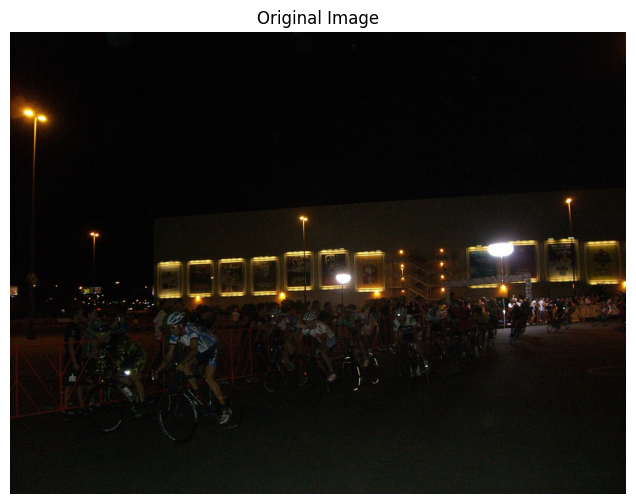

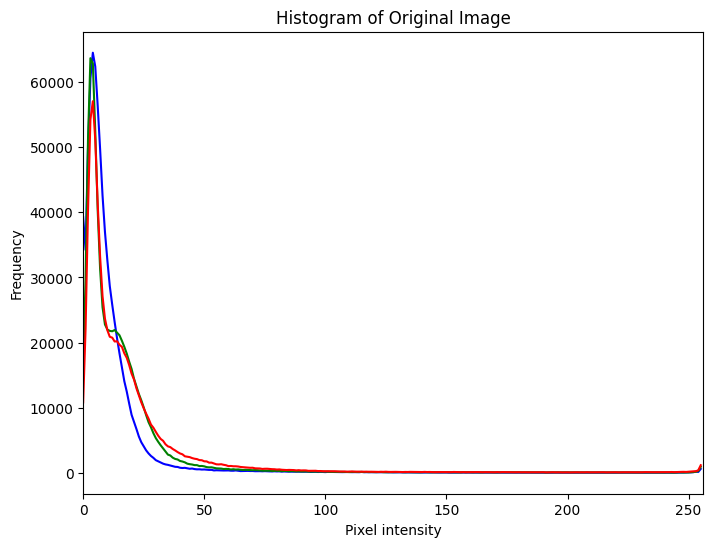

In [ ]:
image = cv2.imread('/content/drive/MyDrive/MVLAB_IMAGES/Ex-2images/2015_00077.jpg')
display_image(image, 'Original Image')
plot_histogram(image, 'Histogram of Original Image')


In [ ]:
def dhe_channel(channel):
    return exposure.equalize_adapthist(channel, clip_limit=0.03) * 255

def dhe(image):
    return apply_equalization_per_channel(image, dhe_channel).astype(np.uint8)


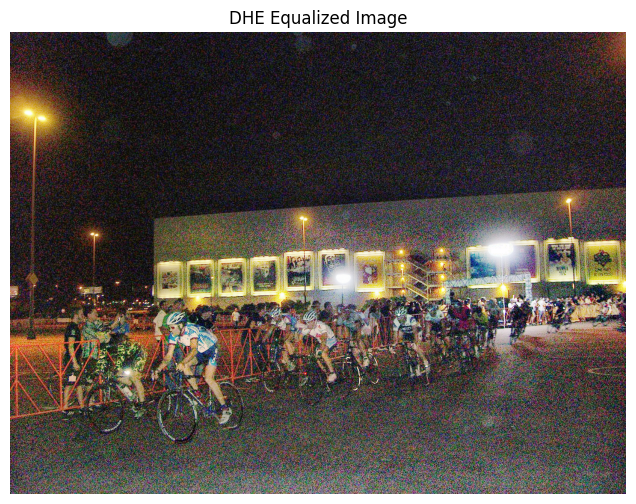

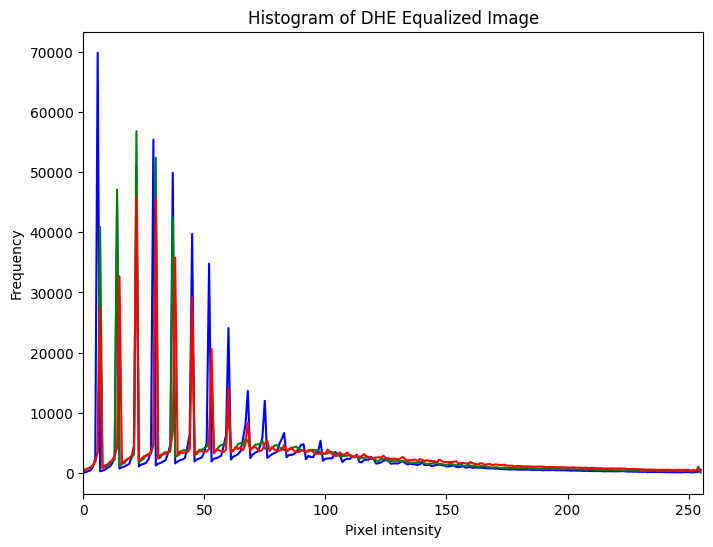

In [ ]:
dhe_image = dhe(image)
display_image(dhe_image, 'DHE Equalized Image')
plot_histogram(dhe_image, 'Histogram of DHE Equalized Image')

In [ ]:
def wthe_channel(channel):
    hist, bins = np.histogram(channel.flatten(), 256, [0, 256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()

    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')

    return cdf[channel]

def wthe(image):
    return apply_equalization_per_channel(image, wthe_channel)

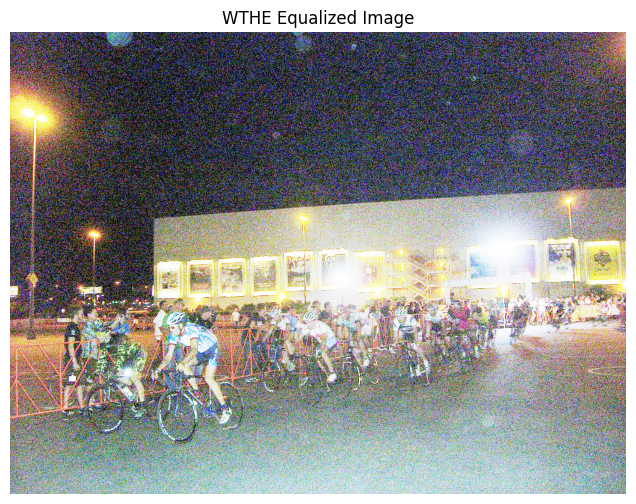

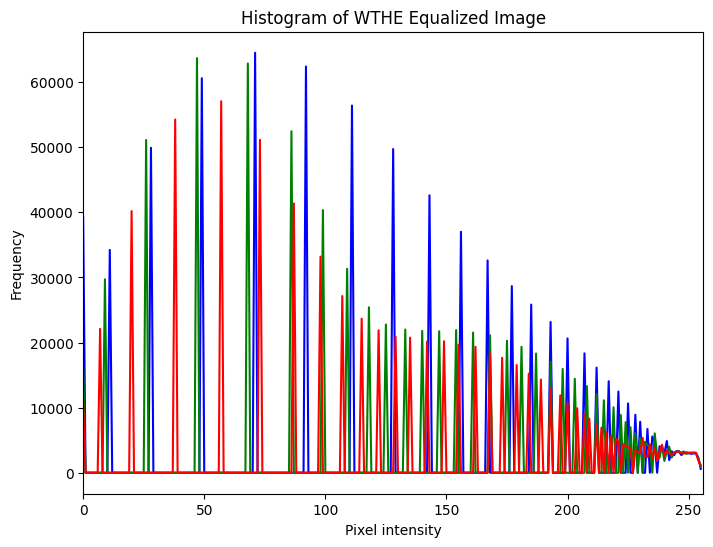

In [ ]:
wthe_image = wthe(image)
display_image(wthe_image, 'WTHE Equalized Image')
plot_histogram(wthe_image, 'Histogram of WTHE Equalized Image')

In [ ]:
def dualistic_sub_image_hist_equalization_color(image):
    channels = cv2.split(image)
    eq_channels = []

    threshold = 128

    for ch in channels:
        gray_channel = ch

        mask1 = gray_channel < threshold
        mask2 = gray_channel >= threshold

        sub_image1 = cv2.bitwise_and(gray_channel, gray_channel, mask=mask1.astype(np.uint8))
        sub_image2 = cv2.bitwise_and(gray_channel, gray_channel, mask=mask2.astype(np.uint8))

        eq_sub_image1 = cv2.equalizeHist(sub_image1)
        eq_sub_image2 = cv2.equalizeHist(sub_image2)

        combined_channel = np.where(mask1, eq_sub_image1, eq_sub_image2)
        eq_channels.append(combined_channel)

    combined_image_color = cv2.merge(eq_channels)

    return combined_image_color

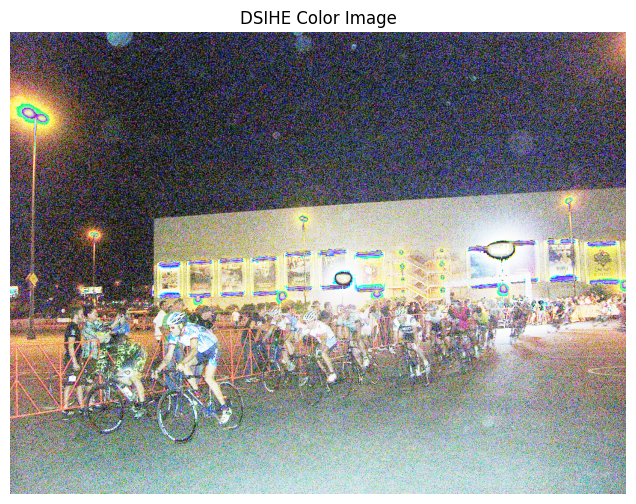

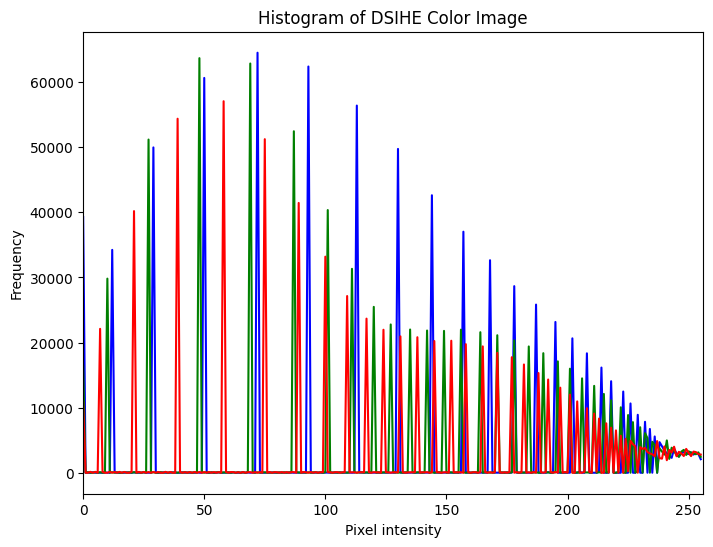

In [ ]:
dsih_image_color = dualistic_sub_image_hist_equalization_color(image)
display_image(dsih_image_color, 'DSIHE Color Image')
plot_histogram(dsih_image_color, 'Histogram of DSIHE Color Image')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def brightness_preserving_dynamic_hist_equalization(image, clip_limit=0.01):
    yuv_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)

    y_channel = yuv_image[:, :, 0]

    def dynamic_hist_equalization(channel, clip_limit):
        hist, bins = np.histogram(channel.flatten(), 256, [0, 256])
        cdf = hist.cumsum()
        cdf_normalized = cdf * 255 / cdf[-1]

        cdf_clipped = np.clip(cdf_normalized, a_min=0, a_max=255)

        equalized_channel = np.interp(channel.flatten(), bins[:-1], cdf_clipped)
        return equalized_channel.reshape(channel.shape)

    equalized_y = dynamic_hist_equalization(y_channel, clip_limit)

    yuv_image[:, :, 0] = equalized_y

    equalized_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2BGR)

    return equalized_image

def plot_histogram(image, title):
    plt.figure(figsize=(8, 6))
    colors = ('b', 'g', 'r')
    for i, color in enumerate(colors):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel intensity')
    plt.ylabel('Frequency')
    plt.show()

def display_image(image, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

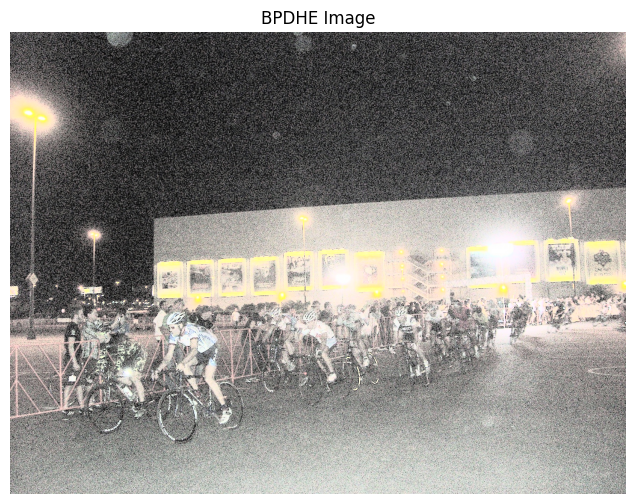

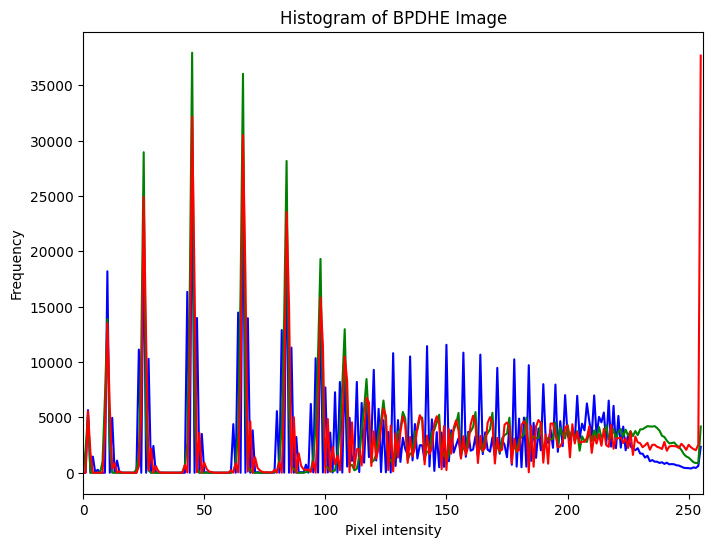

In [ ]:
bpdhe_image = brightness_preserving_dynamic_hist_equalization(image)
display_image(bpdhe_image, 'BPDHE Image')
plot_histogram(bpdhe_image, 'Histogram of BPDHE Image')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def recursive_mean_separate_hist_equalization_color(image, num_iterations=3):
    def equalize_hist_segment(image_segment):
        hist, bins = np.histogram(image_segment.flatten(), 256, [0, 256])
        cdf = hist.cumsum()
        cdf_normalized = cdf * 255 / cdf[-1]

        equalized_segment = np.interp(image_segment.flatten(), bins[:-1], cdf_normalized)
        return equalized_segment.reshape(image_segment.shape)

    def recursive_hist_equalization(image, iterations):
        if iterations == 0:
            return image

        channels = cv2.split(image)
        eq_channels = []

        for ch in channels:
            mean_intensity = np.mean(ch)
            mask1 = ch < mean_intensity
            mask2 = ch >= mean_intensity

            segment1 = ch[mask1]
            segment2 = ch[mask2]

            eq_segment1 = equalize_hist_segment(segment1)
            eq_segment2 = equalize_hist_segment(segment2)

            combined_channel = np.zeros_like(ch)
            combined_channel[mask1] = eq_segment1
            combined_channel[mask2] = eq_segment2

            eq_channels.append(combined_channel)

        combined_image = cv2.merge(eq_channels)

        return recursive_hist_equalization(combined_image, iterations - 1)

    return recursive_hist_equalization(image, num_iterations)

def plot_histogram(image, title):
    plt.figure(figsize=(8, 6))
    colors = ('b', 'g', 'r') if len(image.shape) == 3 else ('gray',)
    for i, color in enumerate(colors):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel intensity')
    plt.ylabel('Frequency')
    plt.show()

def display_image(image, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if len(image.shape) == 3 else image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

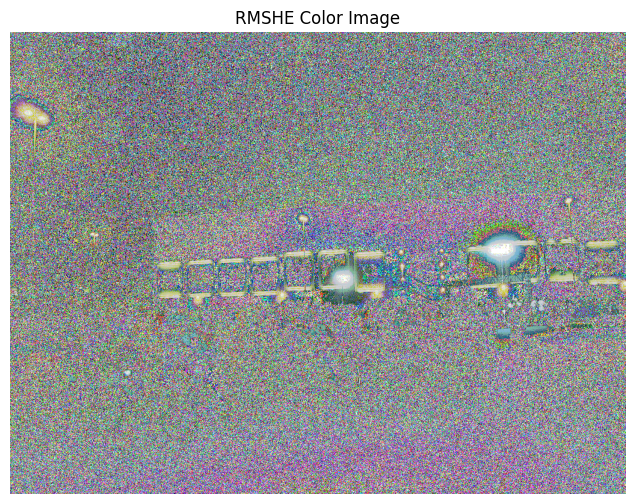

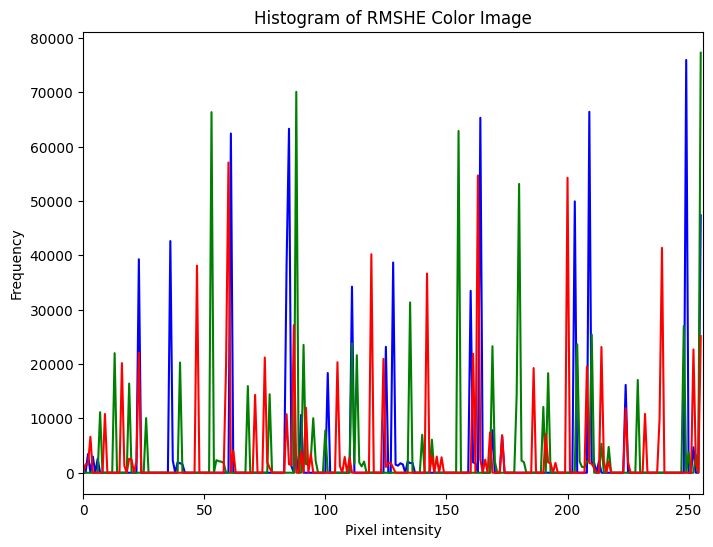

In [ ]:
rmshe_image_color = recursive_mean_separate_hist_equalization_color(image)
display_image(rmshe_image_color, 'RMSHE Color Image')
plot_histogram(rmshe_image_color, 'Histogram of RMSHE Color Image')

In [ ]:
import seaborn as sns

def plot_histogram(image, title):
    plt.figure(figsize=(10, 6))
    if len(image.shape) == 3:
        colors = ('b', 'g', 'r')
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], None, [256], [0, 256])
            sns.lineplot(x=np.arange(256), y=hist.flatten(), color=color, label=f'{color.upper()} Channel')
        plt.legend()
    else:
        hist = cv2.calcHist([image], [0], None, [256], [0, 256])
        sns.lineplot(x=np.arange(256), y=hist.flatten(), color='gray')

    plt.title(title)
    plt.xlabel('Pixel intensity')
    plt.ylabel('Frequency')
    plt.show()

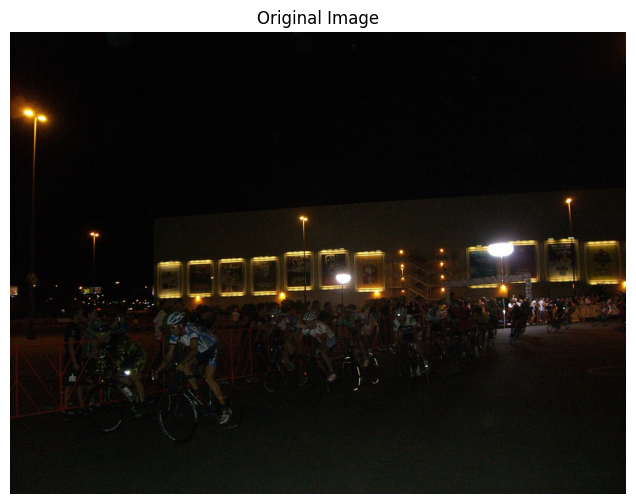

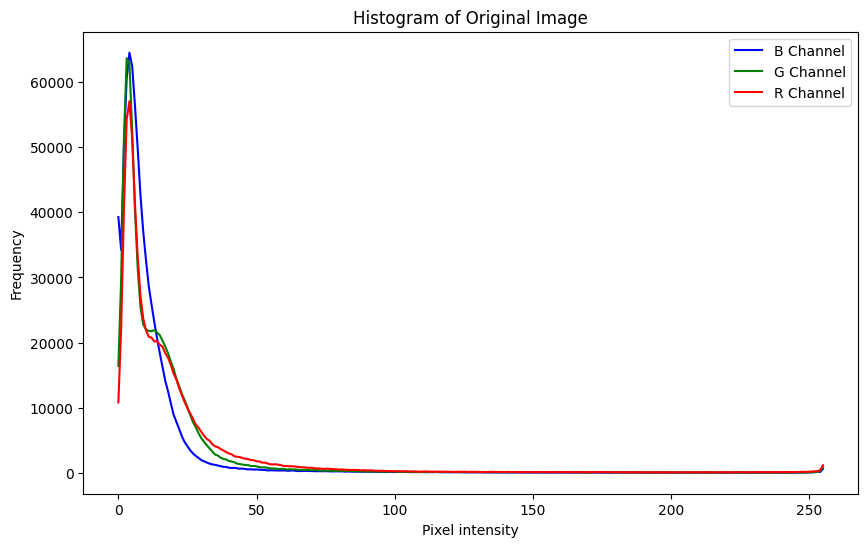

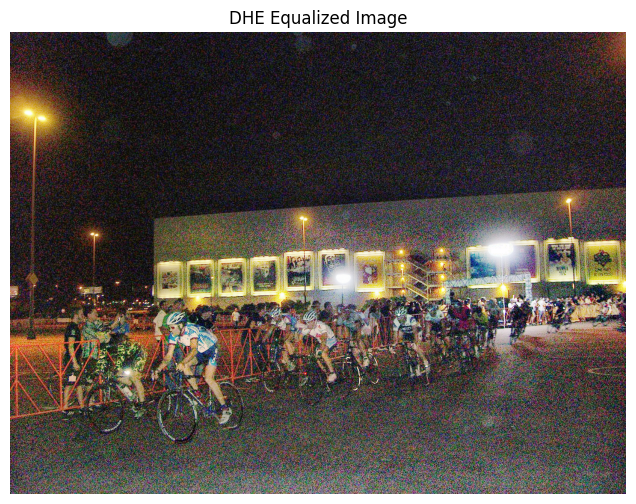

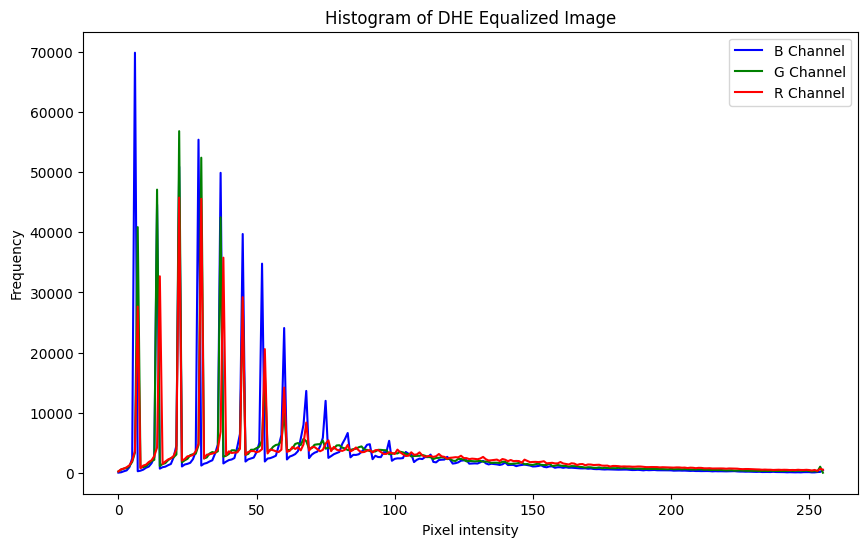

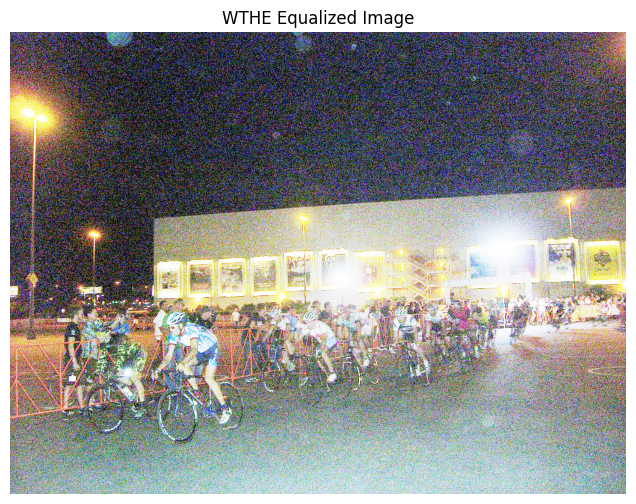

...

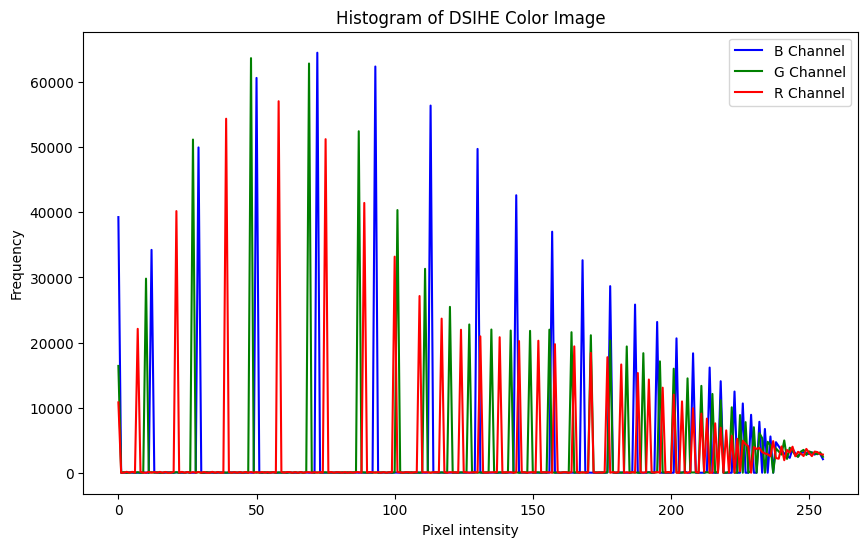

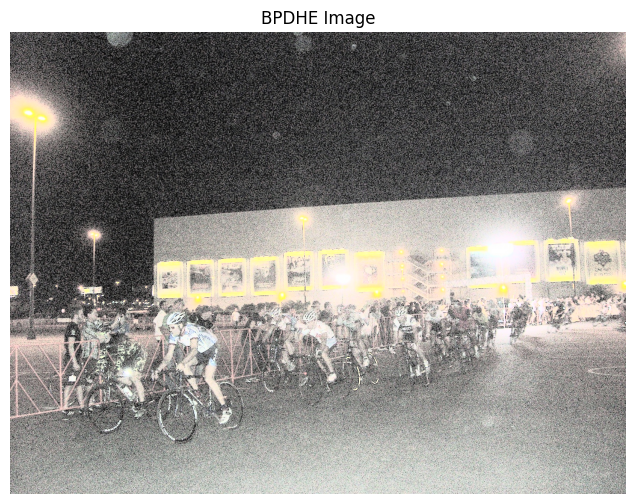

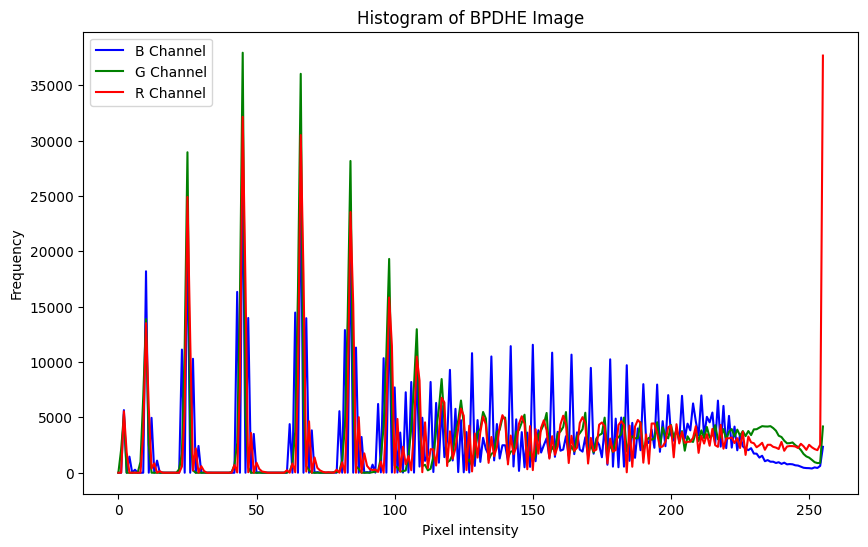

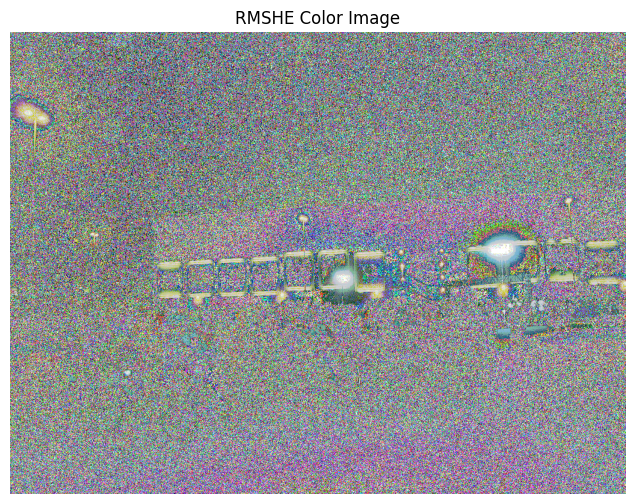

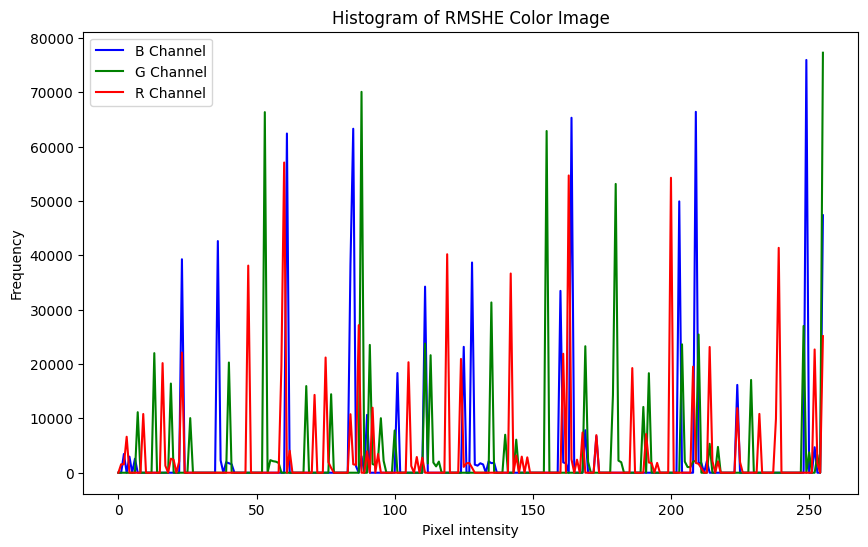

In [ ]:
display_image(image, 'Original Image')
plot_histogram(image, 'Histogram of Original Image')

display_image(dhe_image, 'DHE Equalized Image')
plot_histogram(dhe_image, 'Histogram of DHE Equalized Image')

display_image(wthe_image, 'WTHE Equalized Image')
plot_histogram(wthe_image, 'Histogram of WTHE Equalized Image')

display_image(dsih_image_color, 'DSIHE Color Image')
plot_histogram(dsih_image_color, 'Histogram of DSIHE Color Image')

display_image(bpdhe_image, 'BPDHE Image')
plot_histogram(bpdhe_image, 'Histogram of BPDHE Image')

display_image(rmshe_image_color, 'RMSHE Color Image')
plot_histogram(rmshe_image_color, 'Histogram of RMSHE Color Image')

In [ ]:
import cv2
import numpy as np
import pandas as pd
from skimage import exposure, metrics
from skimage.metrics import structural_similarity as ssim
from skimage.measure import shannon_entropy
from scipy.stats import entropy as scipy_entropy
from math import sqrt
from skimage.color import rgb2gray

In [ ]:
def calculate_metrics(original, equalized, data_range=255, win_size=None, channel_axis=None):
    metrics_dict = {}

    original_gray = rgb2gray(original) if len(original.shape) == 3 else original
    equalized_gray = rgb2gray(equalized) if len(equalized.shape) == 3 else equalized

    metrics_dict['UIQI'] = ssim(original_gray, equalized_gray, data_range=data_range, win_size=win_size, channel_axis=channel_axis)
    metrics_dict['Mean_Original'] = np.mean(original)
    metrics_dict['Mean_Equalized'] = np.mean(equalized)
    metrics_dict['STD_Original'] = np.std(original)
    metrics_dict['STD_Equalized'] = np.std(equalized)
    metrics_dict['PSNR'] = metrics.peak_signal_noise_ratio(original, equalized, data_range=data_range)
    metrics_dict['WPSNR'] = metrics.peak_signal_noise_ratio(original, equalized, data_range=data_range)
    metrics_dict['QRCM'] = (np.std(equalized) / np.std(original)) if np.std(original) != 0 else np.inf
    metrics_dict['MSE'] = np.mean((original - equalized) ** 2)
    metrics_dict['CNR'] = (np.mean(equalized) - np.mean(original)) / np.std(original)
    metrics_dict['Entropy_Original'] = shannon_entropy(original)
    metrics_dict['Entropy_Equalized'] = shannon_entropy(equalized)
    metrics_dict['SSIM'] = ssim(original_gray, equalized_gray, data_range=data_range, win_size=win_size, channel_axis=channel_axis)
    metrics_dict['IQI'] = ssim(original_gray, equalized_gray, data_range=data_range, win_size=win_size, channel_axis=channel_axis)
    metrics_dict['ED'] = np.sqrt(np.sum((original - equalized) ** 2))
    metrics_dict['RMSE'] = sqrt(metrics_dict['MSE'])
    metrics_dict['MI'] = scipy_entropy(original.flatten(), equalized.flatten())
    metrics_dict['UIQ'] = ssim(original_gray, equalized_gray, data_range=data_range, win_size=win_size, channel_axis=channel_axis)
    metrics_dict['AMBE'] = np.abs(np.mean(original) - np.mean(equalized))
    metrics_dict['CEF'] = (np.std(equalized) / np.std(original)) if np.std(original) != 0 else np.inf
    metrics_dict['PCQI'] = ssim(original_gray, equalized_gray, data_range=data_range, win_size=win_size, channel_axis=channel_axis)

    return metrics_dict

In [ ]:
algorithms = {
    'Original': image,
    'DHE': dhe(image),
    'WTHE': wthe(image),
    'DSIHE': dualistic_sub_image_hist_equalization_color(image),
    'BPDHE': brightness_preserving_dynamic_hist_equalization(image),
    'RMSHE': recursive_mean_separate_hist_equalization_color(image)
}

results = []
for name, eq_image in algorithms.items():
    metrics_result = calculate_metrics(image, eq_image)
    metrics_result['Algorithm'] = name
    results.append(metrics_result)

df = pd.DataFrame(results)
df

/usr/local/lib/python3.10/dist-packages/skimage/metrics/simple_metrics.py:167: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


,UIQI,Mean_Original,Mean_Equalized,STD_Original,STD_Equalized,PSNR,WPSNR,QRCM,MSE,CNR,...,SSIM,IQI,ED,RMSE,MI,UIQ,AMBE,CEF,PCQI,Algorithm
0,1.000000,15.318193,15.318193,24.628005,24.628005,inf,inf,1.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,Original
1,0.991990,15.318193,68.023351,24.628005,52.905168,11.934444,11.934444,2.148171,109.289454,2.140050,...,0.991990,0.991990,16057.589234,10.454160,inf,0.991990,52.705159,2.148171,0.991990,DHE
2,0.965601,15.318193,128.596887,24.628005,73.078636,5.919840,5.919840,2.967298,99.095859,4.599589,...,0.965601,0.965601,15290.404279,9.954690,0.270504,0.965601,113.278694,2.967298,0.965601,WTHE
3,0.964946,15.318193,129.199646,24.628005,73.150829,5.780789,5.780789,2.970230,112.390260,4.624063,...,0.964946,0.964946,16283.792310,10.601427,0.368641,0.964946,113.881453,2.970230,0.964946,DSIHE
4,0.964532,15.318193,130.899426,24.628005,69.727690,5.872562,5.872562,2.831236,98.101521,4.693082,...,0.964532,0.964532,15213.498184,9.904621,0.299189,0.964532,115.581233,2.831236,0.964532,BPDHE
5,0.963420,15.318193,139.121493,24.628005,73.886198,4.902252,4.902252,3.000089,93.129281,5.026932,...,0.963420,0.963420,14822.939621,9.650351,0.767855,0.963420,123.803300,3.000089,0.963420,RMSHE


In [ ]:
df.to_csv('Histogram_Equalization_Metrics.csv', index=False)